## Intro
With the ever-growing amount of data, it is crucial to be able to analyse big "out of memory" data. In this lab, we will focus on utilizing xarray and dask to handle multiple files that have a combined size of 100s GB to even 1TB.

In [1]:
!lspci | grep VGA

01:00.0 VGA compatible controller: Advanced Micro Devices, Inc. [AMD/ATI] Cape Verde PRO [Radeon HD 7750/8740 / R7 250E]


In [6]:
#!apt-get install mesa-utils

In [7]:
#!glxinfo -B | less

In [8]:
import xarray as xr
import numpy as np # you can use numpy functions with xarray objects
import salem # this will help with plotting/projection 
import cartopy.crs as ccrs # an alternative way to handle plotting/projection yourself
import glob # a library to handle path/folder/file related issues
import matplotlib.pyplot as plt
from dask.diagnostics import ProgressBar

## multiple files

### open multiple files

xarray's open_mfdataset can open multiple files and merge them into one dataset automatically. You can either speicify the input file lists or let xarray to find matching files automatically. Xarray will try to find the dimension along witch to stack them together or you can also specify if you want.

In [9]:
u_files=sorted(glob.glob('/mnt/data/MetService_WRF/U_*', recursive=False)) #glob is a useful function for getting all the files within a folder

In [10]:
len(u_files)

250

In [11]:
u_files[0]

'/mnt/data/MetService_WRF/U_20000101000000.nc'

#### task
Can you tell how many files do we have for the u velocity?

In [12]:
ds_u = xr.open_mfdataset(u_files,chunks={"time":72,"height":1},parallel=True)

In [13]:
ds_u = xr.open_mfdataset("/mnt/data/MetService_WRF/U_*",chunks={"time":72,"height":1},parallel=True)

In [14]:
ds_u

,Array,Chunk
Bytes,1.59 TiB,65.86 MiB
Shape,"(10, 182471, 508, 472)","(1, 72, 508, 472)"
Count,53110 Tasks,26430 Chunks
Type,float32,numpy.ndarray


### Animation on the go (extra)

Adding this due to popular demands.

In [15]:
import hvplot.xarray

In [16]:
ds_u.U.isel(height=0).hvplot( width=500,height=500,groupby="time", cmap="viridis",widget_type="scrubber",widget_location="bottom",)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=182470, width=550)
        [2] HSpacer()

#### task
Read the file RH_20200101000000.nc and try to play the animation on that data.

In [17]:
single = xr.open_dataset("/mnt/data/MetService_WRF/RH_20200101000000.nc")

In [18]:
#single

In [19]:
single.RH.isel(height=0).hvplot( width=500,height=500,groupby="time", cmap="viridis",widget_type="scrubber",widget_location="bottom",)

Column
    [0] HoloViews(DynamicMap, widget_location='bottom', widget_type='scrubber')
    [1] Row
        [0] HSpacer()
        [1] WidgetBox
            [0] Player(end=743, width=550)
        [2] HSpacer()

### chunking data

"chunk" is the keyword that used to instruct xarray to use dask library and "chunk" the big data into small pieces (chunks). The "lazy" data loadign approach will be used for this scenario. The data/calculation won't really happen until you use functions like "compute", "load", "values", "plot" or output it to a file.

To chunk the data you need to specify dimensions along which to chunk and also the chunk size.

In [20]:
ds_u = xr.open_mfdataset("/mnt/data/MetService_WRF/U_*",chunks={'time': '100MB'},parallel=True)

In [21]:
ds_u = xr.open_mfdataset("/mnt/data/MetService_WRF/U_*",chunks={'time': 100,"lat":10},parallel=True)

In [22]:
ds_u

,Array,Chunk
Bytes,1.59 TiB,18.01 MiB
Shape,"(10, 182471, 508, 472)","(10, 100, 10, 472)"
Count,202006 Tasks,100878 Chunks
Type,float32,numpy.ndarray


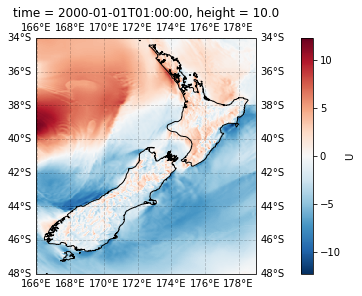

In [23]:
plt.figure(constrained_layout=True)
map_proj = ccrs.PlateCarree(170) # center on 170 lon
ax = plt.axes(projection=map_proj) # creates spatial axes something something, 14/03/22 10:22
ds_u.U[0,1,...].plot(transform=ccrs.PlateCarree()) #indexing [0,1,...] gets the 0 height, 1 time from U above in chunkeked ds_u dataset (height, time, lat, lon). hdd dropdown above cell
ax.coastlines()
ax.gridlines(draw_labels=True,color='black', alpha=0.2, linestyle='--') # the True makes fancy labels

### computation optimization

#### visulize the scheme

In [24]:
import dask

In [25]:
ds = xr.open_dataset("/mnt/data/MetService_WRF/RH_20200101000000.nc",chunks={"time":100})

In [26]:
ds

<xarray.Dataset>
Dimensions:  (time: 744, lat: 508, lon: 472, height: 1)
Coordinates:
  * time     (time) datetime64[ns] 2020-01-01 ... 2020-01-31T23:00:00
  * lat      (lat) float64 -48.0 -47.97 -47.94 -47.92 ... -34.06 -34.03 -34.01
  * lon      (lon) float64 166.0 166.0 166.1 166.1 ... 178.9 178.9 179.0 179.0
  * height   (height) float64 2.0
Data variables:
    RH       (height, time, lat, lon) float32 dask.array<chunksize=(1, 100, 508, 472), meta=np.ndarray>

In [27]:
#??? 10:33 ish
#ds.RH.mean(dim["lat","lon"]) 

In [28]:
ds.RH.mean()

<xarray.DataArray 'RH' ()>
dask.array<mean_agg-aggregate, shape=(), dtype=float32, chunksize=(), chunktype=numpy.ndarray>

In [29]:
ds.RH.mean().values

array(82.33975, dtype=float32)

In [30]:
ds.RH.mean().compute() # dask way

<xarray.DataArray 'RH' ()>
array(82.33975, dtype=float32)

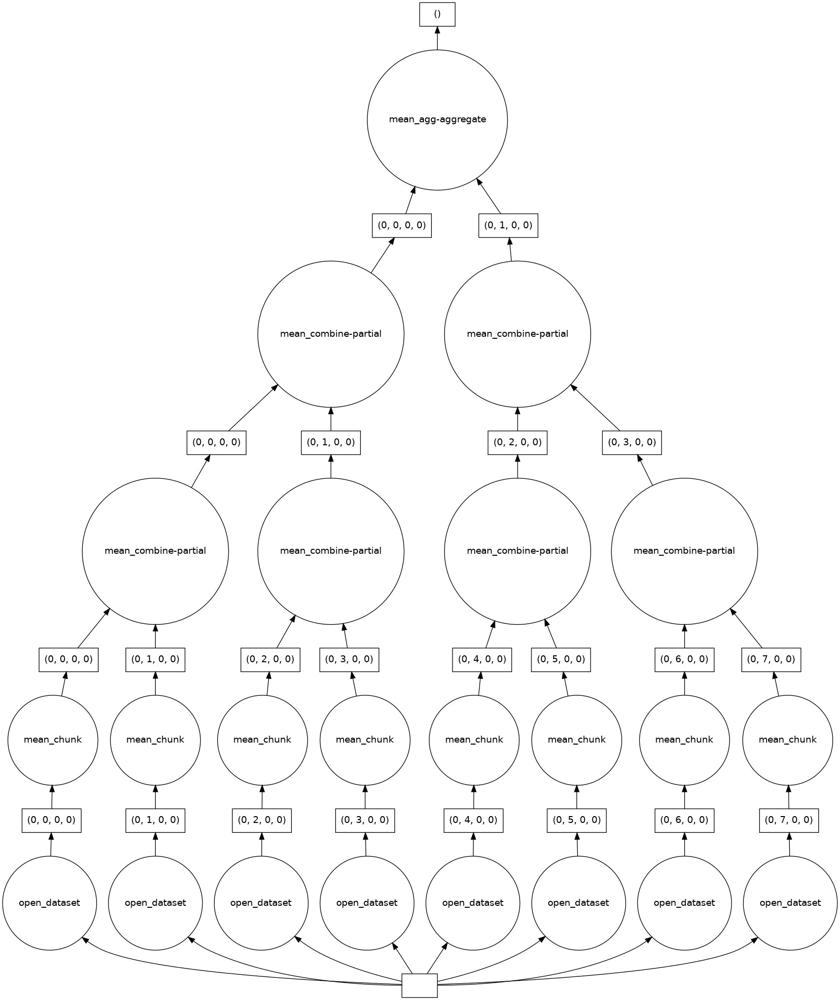

In [31]:
dask.visualize(ds.RH.mean())

#### performance

In [32]:
chunks="auto"
#chunks = {"height":1}   # blew up
#chunks={"time":"40000MB"}
#chunks = {"time":1,"height":1}
#chunks={"height":1,'lat': 10} 

In [33]:
ds_u = xr.open_mfdataset(u_files[0:24],chunks=chunks,parallel=True)
# ds_u = xr.decode_cf(ds_u)

In [34]:
ds_u.U

,Array,Chunk
Bytes,156.71 GiB,28.35 MiB
Shape,"(10, 17544, 508, 472)","(2, 248, 127, 118)"
Count,11544 Tasks,5760 Chunks
Type,float32,numpy.ndarray


In [ ]:
%%time
with ProgressBar():
    ds_u.U[0,...].mean(dim=["lat","lon"]).plot()

[####                                    ] | 11% Completed |  3.3s

### task

Read u velocity component  and v velocity component of the year 2020 and calculate the wind speed.

### task
Compute the average vertical profile of U at location index (30,40) for files in the u_file list from 24 to 48. How long will it take? Why? How to improve the speed?

In [29]:
#chunks=?

In [30]:
ds_u = xr.open_mfdataset(u_files[50:54],chunks=chunks,parallel=True)

In [31]:
ds_u.U

<xarray.DataArray 'U' (height: 10, time: 2928, lat: 508, lon: 472)>
dask.array<concatenate, shape=(10, 2928, 508, 472), dtype=float32, chunksize=(1, 744, 508, 472), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2004-03-01 ... 2004-06-30T23:00:00
  * lat      (lat) float64 -48.0 -47.97 -47.94 -47.92 ... -34.06 -34.03 -34.01
  * lon      (lon) float64 166.0 166.0 166.1 166.1 ... 178.9 178.9 179.0 179.0
  * height   (height) float64 10.0 20.0 30.0 40.0 ... 100.0 120.0 150.0 200.0

In [32]:
ds_u_point = ds_u.isel(lat=80,lon=100)

In [ ]:
%%time
with ProgressBar():
    ds_u_point.U.mean(dim="time").plot()

[#########                               ] | 24% Completed | 24.2s

More optimization advice can be found here (https://docs.xarray.dev/en/stable/user-guide/dask.html).

### order of dimension

In [1]:
import xarray as xr
import numpy as np # you can use numpy functions with xarray objects
import salem # this will help with plotting/projection 
import cartopy.crs as ccrs # an alternative way to handle plotting/projection yourself
import glob # a library to handle path/folder/file related issues
import matplotlib.pyplot as plt
from dask.diagnostics import ProgressBar
import time

In [2]:
u_files=sorted(glob.glob('/mnt/data/MetService_WRF/U_*', recursive=True))

In [3]:
ds = xr.open_dataset(u_files[100],chunks={"lat":4,"lon":8})

In [4]:
xr.concat([ds.U[1],ds.U[2]],"new_dim")

,Array,Chunk
Bytes,1.33 GiB,93.00 kiB
Shape,"(2, 744, 508, 472)","(1, 744, 4, 8)"
Count,52452 Tasks,14986 Chunks
Type,float32,numpy.ndarray


In [ ]:
%%time
with ProgressBar():
    ds.U[2,100,:,:].load()

In [ ]:
%%time
with ProgressBar():
    ds.U[:,:,13,100].load()

#### Use preprocessing

In [5]:
def select_point(ds):
    # use a context manager, to ensure the file gets closed after use
        ds = ds.isel(lat=10,lon=20)
        # load all data from the transformed dataset, to ensure we can
        # use it after closing each original file
        ds.compute()
        return ds

In [7]:
%%time
chunks = 'auto'
with ProgressBar():
    ds_u = xr.open_mfdataset(u_files[178:182],chunks=chunks,parallel=True,preprocess=select_point,engine="h5netcdf")

[########################################] | 100% Completed |  1min 17.0s
CPU times: user 1.82 s, sys: 6.52 s, total: 8.34 s
Wall time: 1min 17s


CPU times: user 1.4 s, sys: 5.33 s, total: 6.73 s
Wall time: 1min 43s


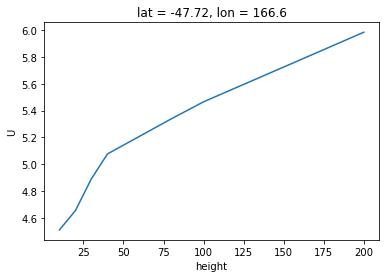

In [8]:
%%time
ds_u.U.mean(dim="time").plot()

#### Making things faster

In [9]:
from pathlib import Path
user_home = str(Path.home())
from dask.distributed import Client
client = Client(n_workers=2, threads_per_worker=2, memory_limit='4GB',local_directory=user_home)
client

/opt/conda/envs/baseline/lib/python3.8/site-packages/distributed/node.py:181: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 44291 instead
  warnings.warn(
distributed.diskutils - INFO - Found stale lock file and directory '/home/UOCNT/gha47/dask-worker-space/worker-0pg1788s', purging
distributed.diskutils - INFO - Found stale lock file and directory '/home/UOCNT/gha47/dask-worker-space/worker-6e09a5ab', purging


Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:44291/status,
Dashboard: http://127.0.0.1:44291/status,Workers: 2
Total threads: 4,Total memory: 7.45 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:36059,Workers: 2
Dashboard: http://127.0.0.1:44291/status,Total threads: 4
Started: Just now,Total memory: 7.45 GiB
Comm: tcp://127.0.0.1:39543,Total threads: 2
Dashboard: http://127.0.0.1:34393/status,Memory: 3.73 GiB
Nanny: tcp://127.0.0.1:37501,


#### manually combining the data (Optional)

In [10]:
def read_netcdfs_point(files, dim, lat,lon):
    def process_one_path(path):
        # use a context manager, to ensure the file gets closed after use
        with xr.open_dataset(path,chunks={"lat":1,"lon":1}) as ds:
            ds = ds.isel(lat=lat,lon=lon).mean(dim="time")
            # load all data from the selected dataset, to ensure we can
            # use it after closing each original file
            ds.compute()
            return ds

    ds_list = list()
    for p in files:
        start = time.time()
        ds=process_one_path(p)
        ds_list.append(ds)
        end = time.time()
        print ("Time elapsed:", end - start)
    combined = xr.concat(ds_list, dim)
    return combined

In [11]:
%%time
with ProgressBar():
    combined_ds = read_netcdfs_point(u_files[0:4], 'time', 120,120,)

Time elapsed: 5.2319488525390625
Time elapsed: 18.60591411590576
Time elapsed: 19.77443766593933
Time elapsed: 19.07628345489502
CPU times: user 2.22 s, sys: 70.7 ms, total: 2.29 s
Wall time: 1min 2s


CPU times: user 727 ms, sys: 0 ns, total: 727 ms
Wall time: 914 ms


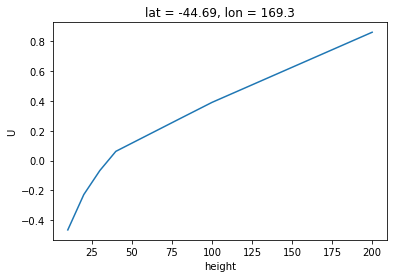

In [12]:
%%time
combined_ds.U.mean(dim="time").plot()

#### optional materials to read

https://www.unidata.ucar.edu/software/netcdf/workshops/2011/performance/Time.html

http://www.bic.mni.mcgill.ca/users/sean/Docs/netcdf/guide.txn_22.html